Небольшое количество обучающих примеров отрицательно влияет на результаты применения модели к новым данным. Это явление известно как переобучение. 

В случае переобучения модель подстраивается под особенности отдельных примеров, а не под общие зависимости в данных, и не приобретает способности к обобщению - т.е., к возможности распространять обнаруженные на обучающем наборе закономерности на новые данные.

Как следствие, модель может начать проверять новые данные не на соответствие общим зависимостям, а на соответствие отдельным примерам из обучающего набора. В итоге модель сможет распознать новое наблюдение только в том случае, если оно совпадает с одним из обучающих примеров.

Одним из способов решения проблемы переобучения является увеличение количества обучающих примеров **(data augmentation)**.

**Data augmentation** использует следующий подход: генерация большего количества обучающих примеров из уже существующих, путем случайных преобразований, дающих в результате правдоподобные изображения.
Цель состоит в том, чтобы модель никогда не увидела одно и то же изображение дважды во время обучения.

---

In [4]:
import cv2
# LOAD AN IMAGE USING 'IMREAD'
img = cv2.imread("Lenna.png")
img=img[:,:,[2,0,1]]
frameWidth=img.shape[0]
frameHeight=img.shape[1]
print(img.shape)
#img = cv2.resize(img,(0,0), fx=2,fy=2)
#img = img[int(img.shape[0]/2-frameWidth/2):int(img.shape[0]/2+frameWidth/2),int(img.shape[1]/2-frameHeight/2):int(img.shape[1]/2+frameHeight/2)]
#BGR - > RGB (2,0,1)

(512, 512, 3)


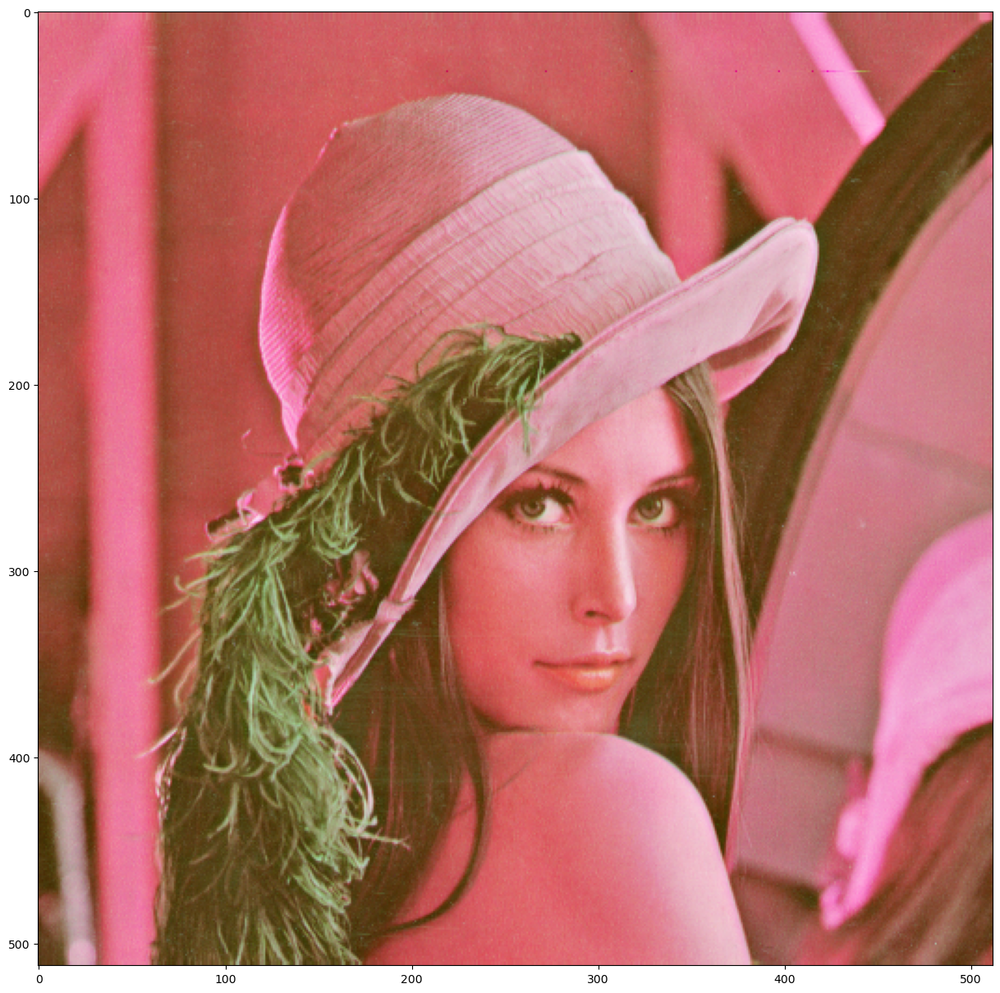

In [5]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15,20))
plt.imshow(img)

In [8]:
RGBA_=cv2.cvtColor(img,cv2.COLOR_RGB2RGBA)

In [17]:
RGBA_[:,:,[3]]=255

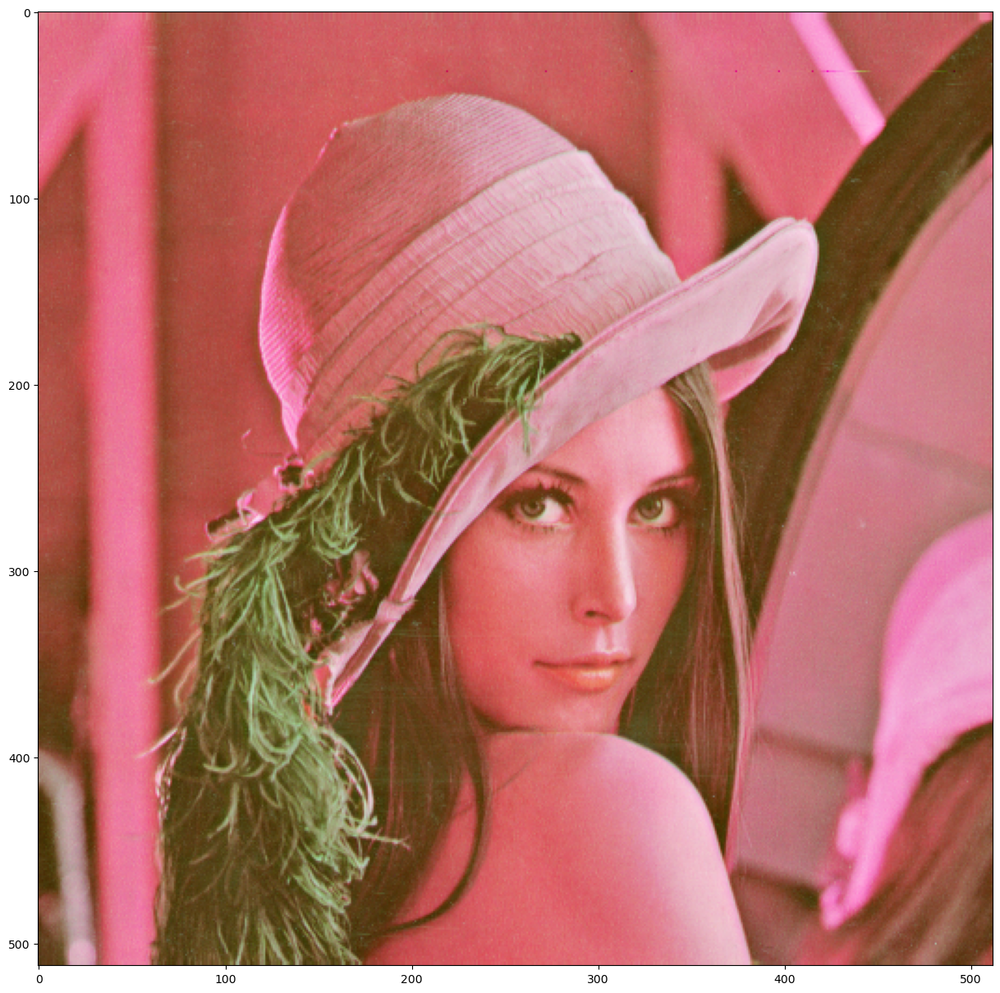

In [18]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15,20))
plt.imshow(RGBA_)

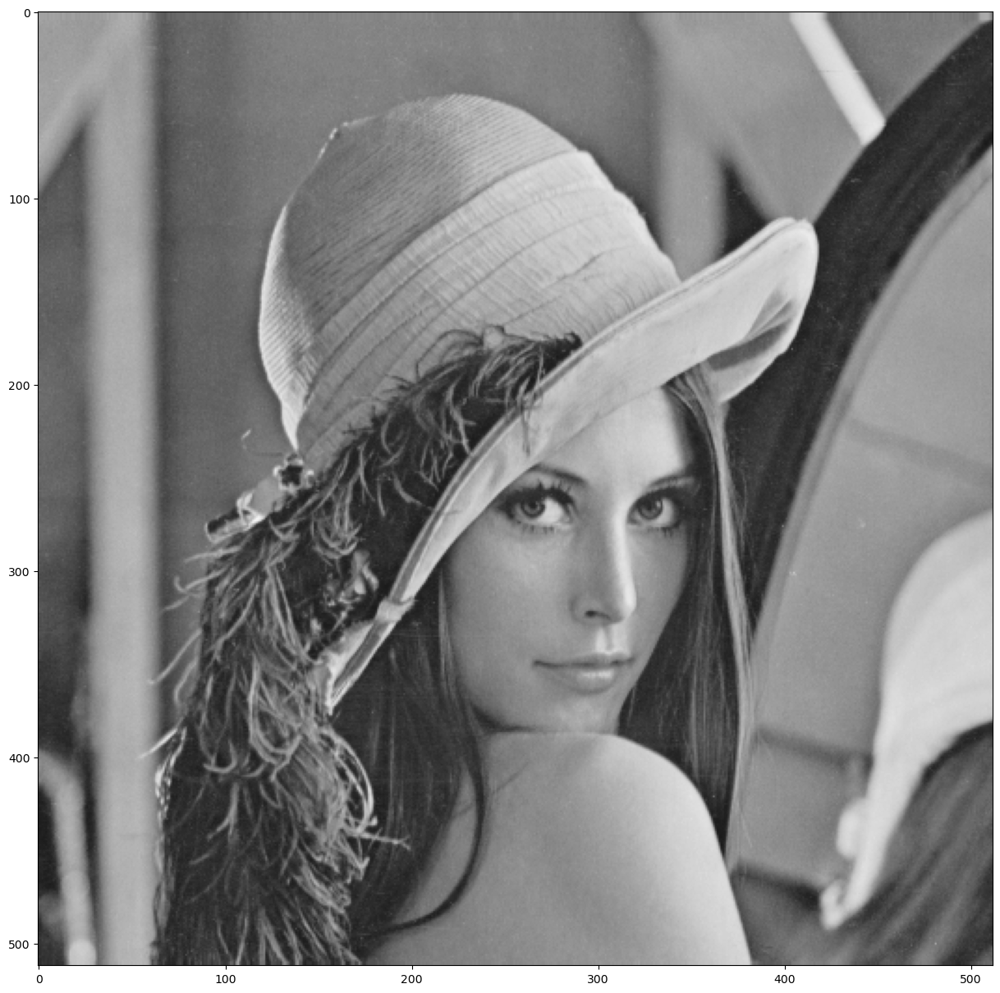

In [19]:
import cv2
# LOAD AN IMAGE USING 'IMREAD'
img = cv2.imread("Lenna.png")
imgGray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
plt.figure(figsize=(15,20))
plt.imshow(imgGray, cmap='gray', vmin=0, vmax=255);

In [20]:
import numpy as np
import random
def sp_noise(image,prob):
    '''
    Add salt and pepper noise to image
    prob: Probability of the noise
    '''
    print(image.shape)
    output = np.zeros(image.shape,np.uint8)
    
    thres = 1 - prob 
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            rdn = random.random()
            if rdn < prob:
                output[i][j] = 0
            elif rdn > thres:
                output[i][j] = 255
            else:
                output[i][j] = image[i][j]
    return output

image = cv2.imread('lena.jpg') # Only for grayscale image
noise_img = sp_noise(image,0.01)
noise_img=noise_img[:,:,[2,0,1]]

(676, 1200, 3)


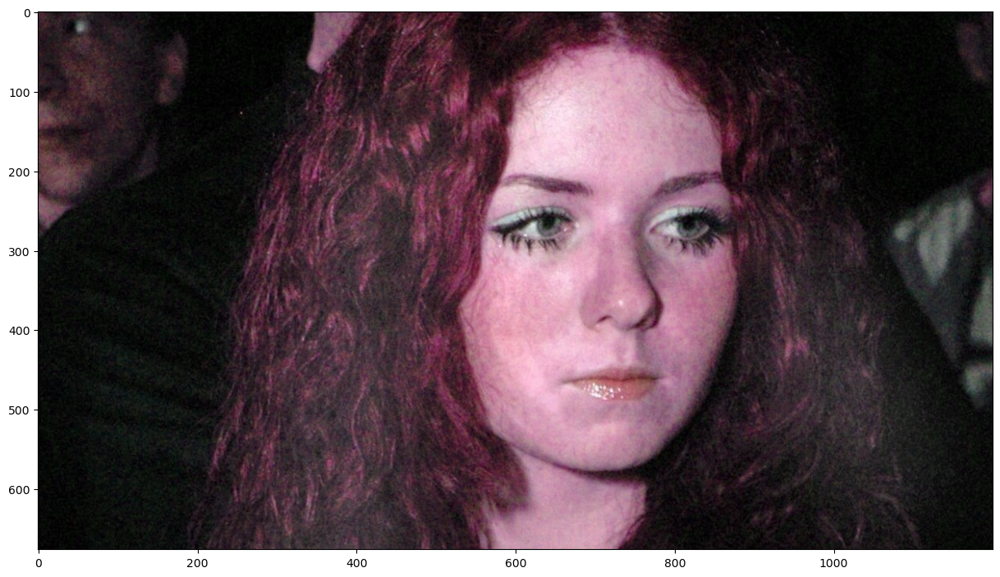

In [23]:
plt.figure(figsize=(15,20))
plt.imshow(image[:,:,[2,0,1]])

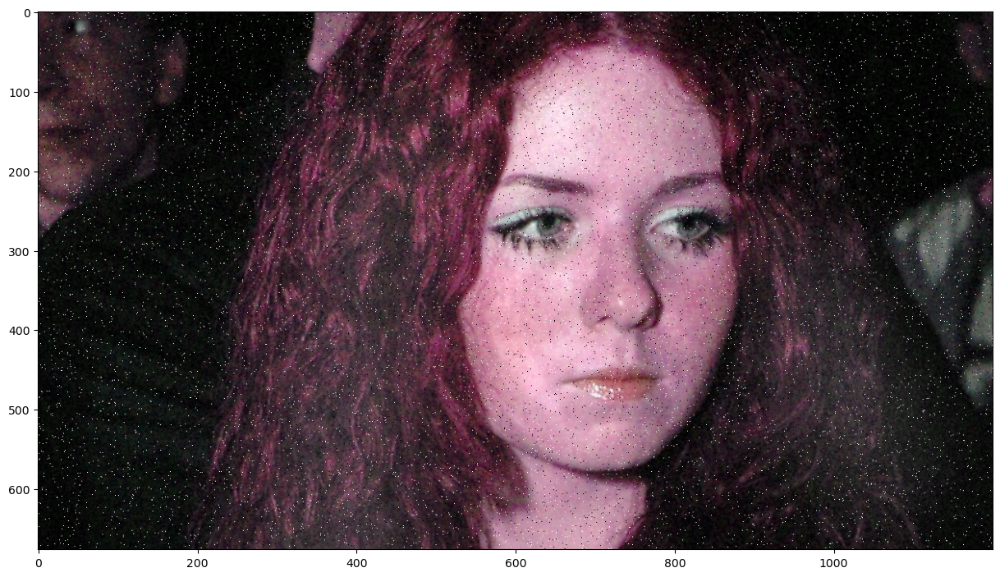

In [24]:

plt.figure(figsize=(15,20))
plt.imshow(noise_img)

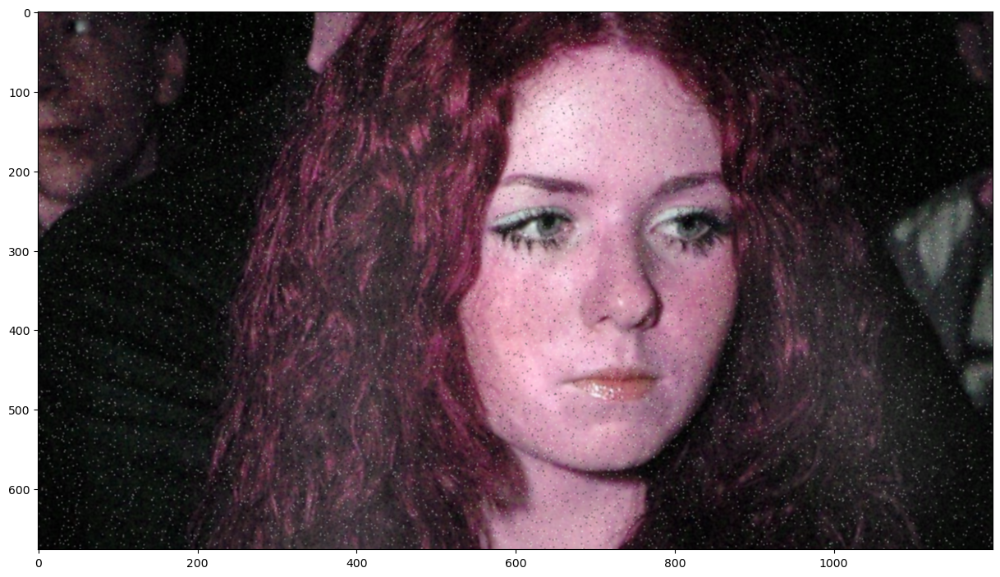

In [28]:
import cv2
img = cv2.GaussianBlur(noise_img,(3,3),0)
plt.figure(figsize=(15,20))
plt.imshow(img)

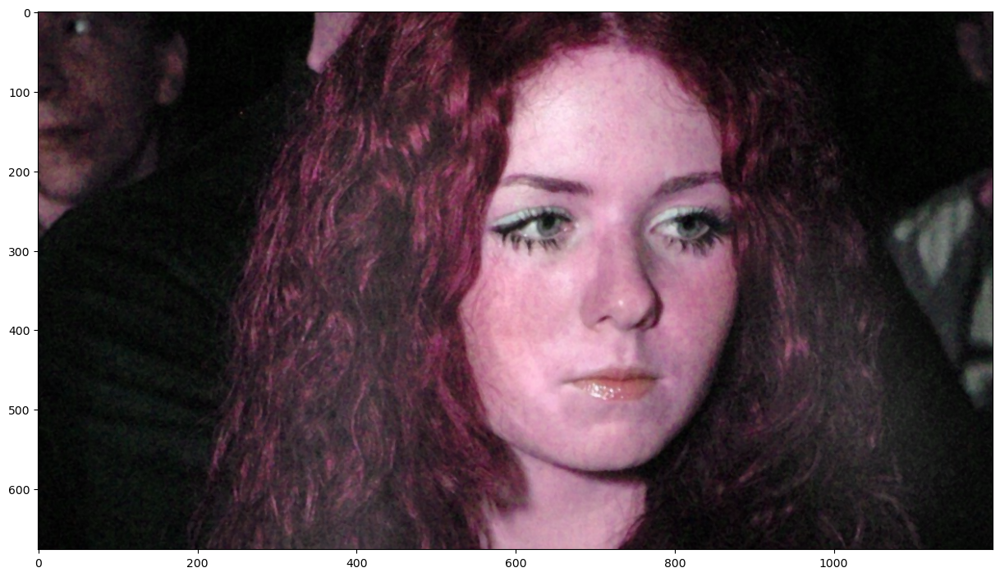

In [35]:
#Медианный фильтр заменяет средним
img = cv2.medianBlur(noise_img,3)
plt.figure(figsize=(15,20))
plt.imshow(img)

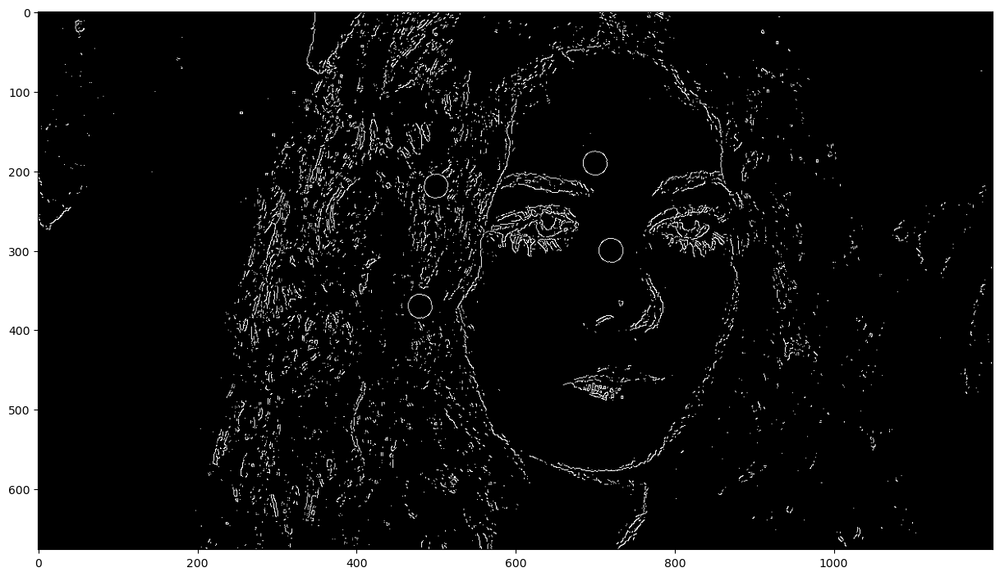

In [44]:
imgCanny = cv2.Canny(img,130,130)
plt.figure(figsize=(15,20))
plt.imshow(imgCanny,cmap='gray', vmin=0, vmax=255)

In [54]:
import cv2
import numpy as np

img = cv2.imread('1.jpg')
print(img.shape)
width, height = 450,300
pts1 = np.float32([[420,300],[500,300],[420,400],[470,300]])
pts2 = np.float32([[0,0],[width,0],[0,height],[width,height]])
matrix = cv2.getPerspectiveTransform(pts1,pts2)
imgOutput = cv2.warpPerspective(img,matrix,(width,height))
for x in range (0,4):
    print(pts1[x][0],pts1[x][1])
    cv2.circle(img,(int(pts1[x][0]),int(pts1[x][1])),15,(0,255,0),cv2.FILLED)


(486, 870, 3)
420.0 300.0
500.0 300.0
420.0 400.0
470.0 300.0


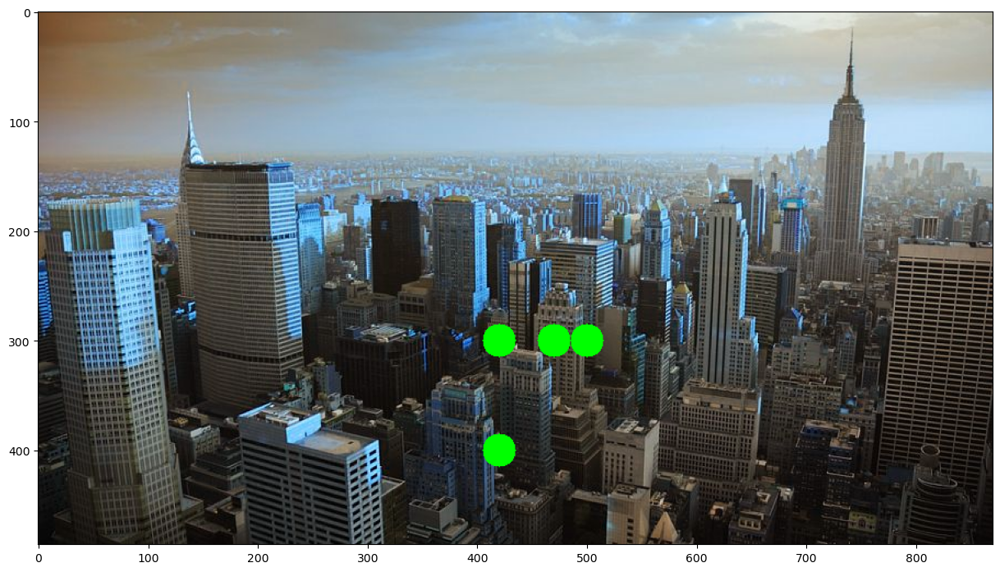

In [55]:
plt.figure(figsize=(15,20))
plt.imshow(img)

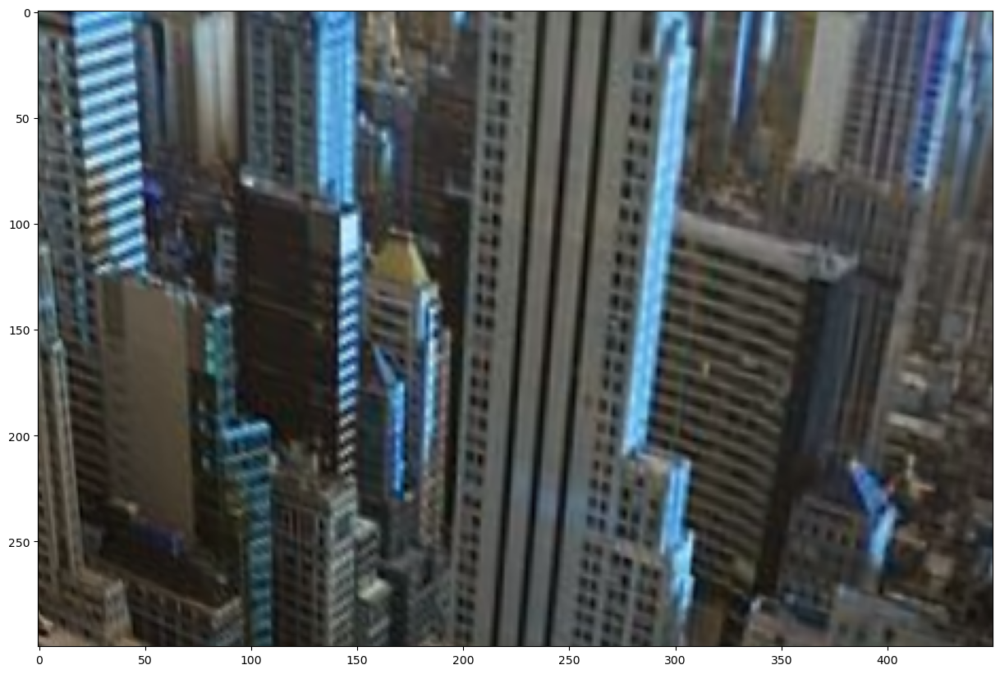

In [51]:
plt.figure(figsize=(15,20))
plt.imshow(imgOutput)

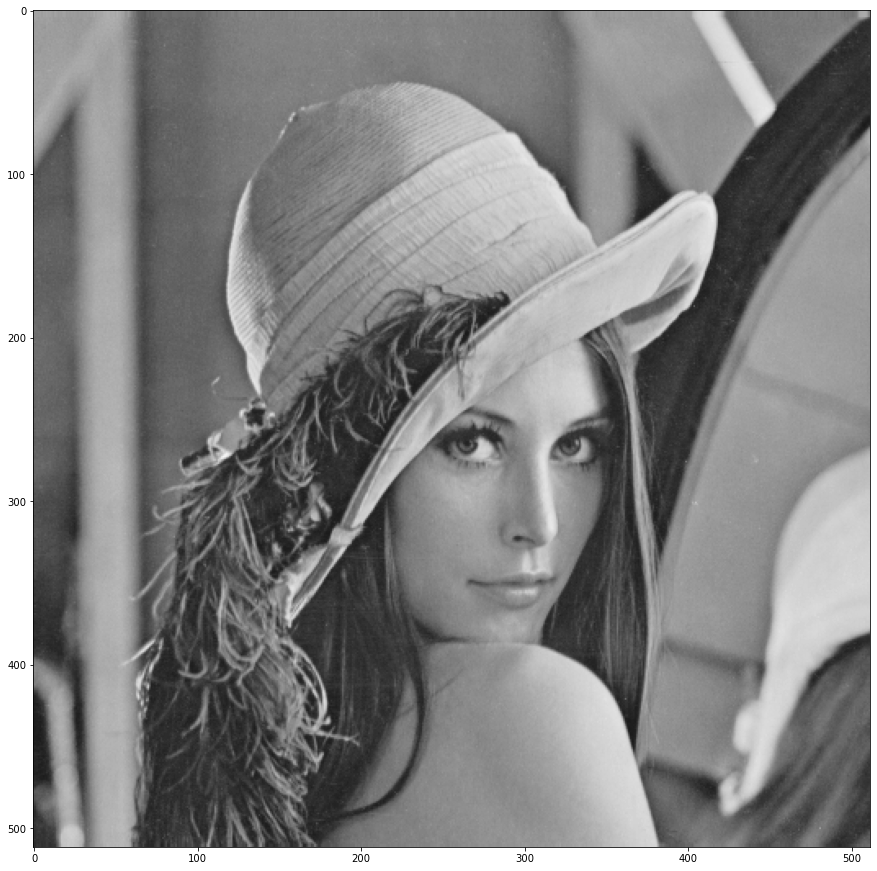

In [119]:
import cv2
# LOAD AN IMAGE USING 'IMREAD'
img = cv2.imread("Lenna.png")
imgGray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
plt.figure(figsize=(15,20))
plt.imshow(imgGray, cmap='gray', vmin=0, vmax=255);

In [130]:
import numpy as np
import random
def sp_noise(image,prob):
    '''
    Add salt and pepper noise to image
    prob: Probability of the noise
    '''
    print(image.shape)
    output = np.zeros(image.shape,np.uint8)
    
    thres = 1 - prob 
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            rdn = random.random()
            if rdn < prob:
                output[i][j] = 0
            elif rdn > thres:
                output[i][j] = 255
            else:
                output[i][j] = image[i][j]
    return output

image = cv2.imread('lena.jpg') # Only for grayscale image
noise_img = sp_noise(image,0.01)
noise_img=noise_img[:,:,[2,0,1]]



(676, 1200, 3)


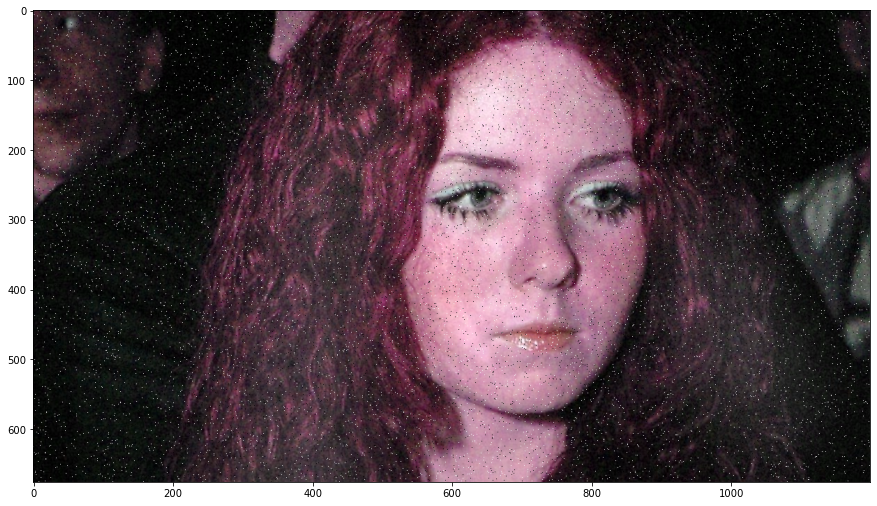

In [132]:

plt.figure(figsize=(15,20))
plt.imshow(noise_img)

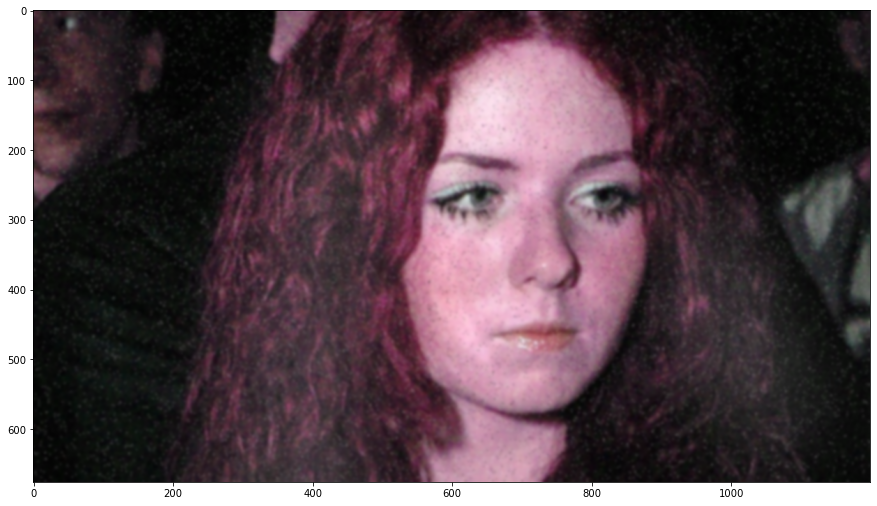

In [135]:
import cv2
# LOAD AN IMAGE USING 'IMREAD'
#img = cv2.imread("lena.jpg")
#img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
img = cv2.GaussianBlur(noise_img,(11,11),0)
plt.figure(figsize=(15,20))
plt.imshow(img)

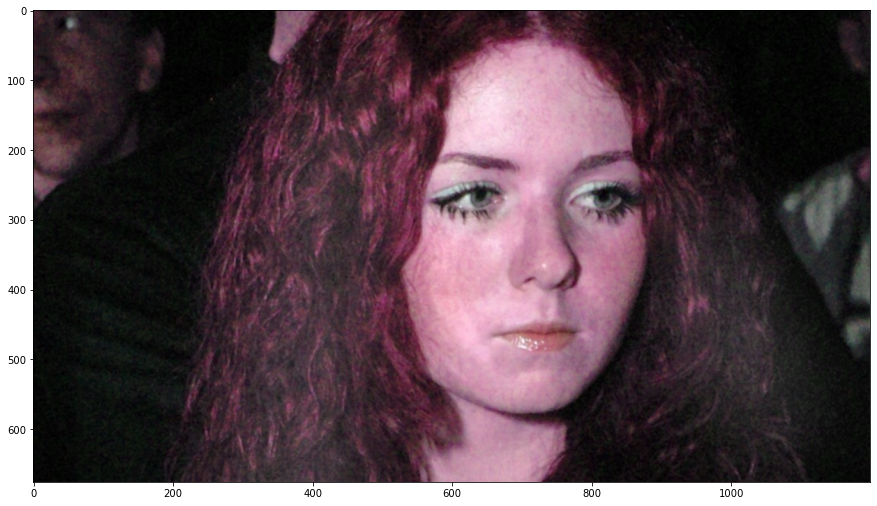

In [136]:
#Медианный фильтр заменяет средним
img = cv2.medianBlur(noise_img,3)
plt.figure(figsize=(15,20))
plt.imshow(img)

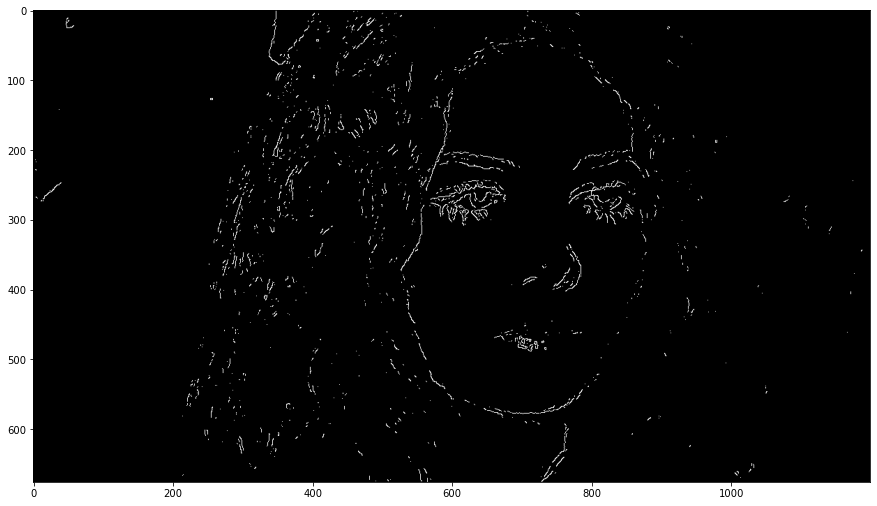

In [137]:
imgCanny = cv2.Canny(img,150,150)
plt.figure(figsize=(15,20))
plt.imshow(imgCanny,cmap='gray', vmin=0, vmax=255)

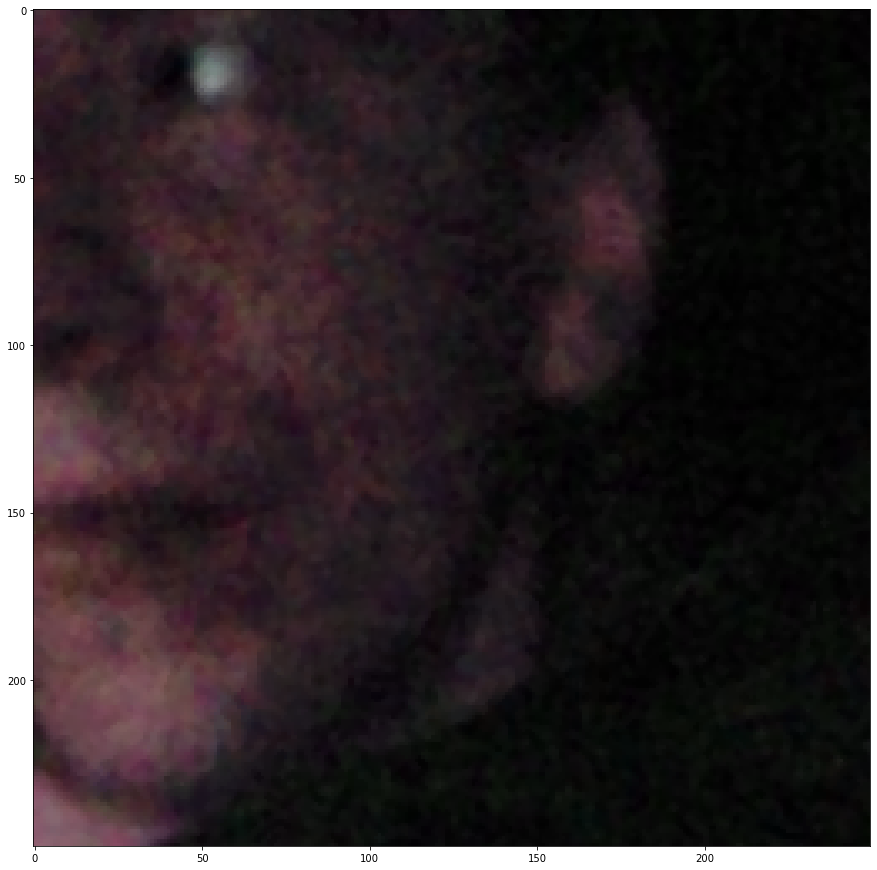

In [138]:
img3=img[0:250,0:250]
plt.figure(figsize=(15,20))
plt.imshow(img3)

In [139]:
import cv2
import numpy as np

img = cv2.imread('lena.jpg')
print(img.shape)
width, height = 450,300
pts1 = np.float32([[500,219],[700,190],[480,370],[720,300]])
pts2 = np.float32([[0,0],[width,0],[0,height],[width,height]])
matrix = cv2.getPerspectiveTransform(pts1,pts2)
imgOutput = cv2.warpPerspective(img,matrix,(width,height))
for x in range (0,4):
    print(pts1[x][0],pts1[x][1])
    cv2.circle(img,(int(pts1[x][0]),int(pts1[x][1])),15,(0,255,0),cv2.FILLED)





(676, 1200, 3)
500.0 219.0
700.0 190.0
480.0 370.0
720.0 300.0


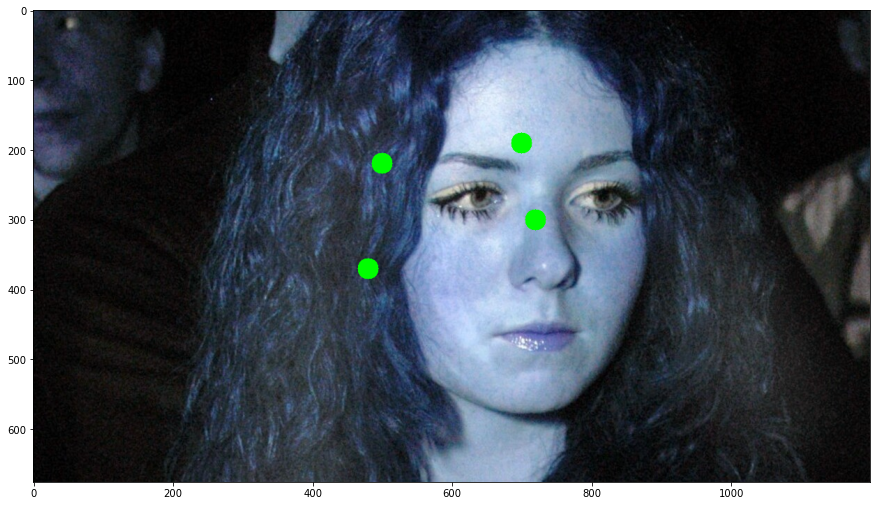

In [140]:
plt.figure(figsize=(15,20))
plt.imshow(img)

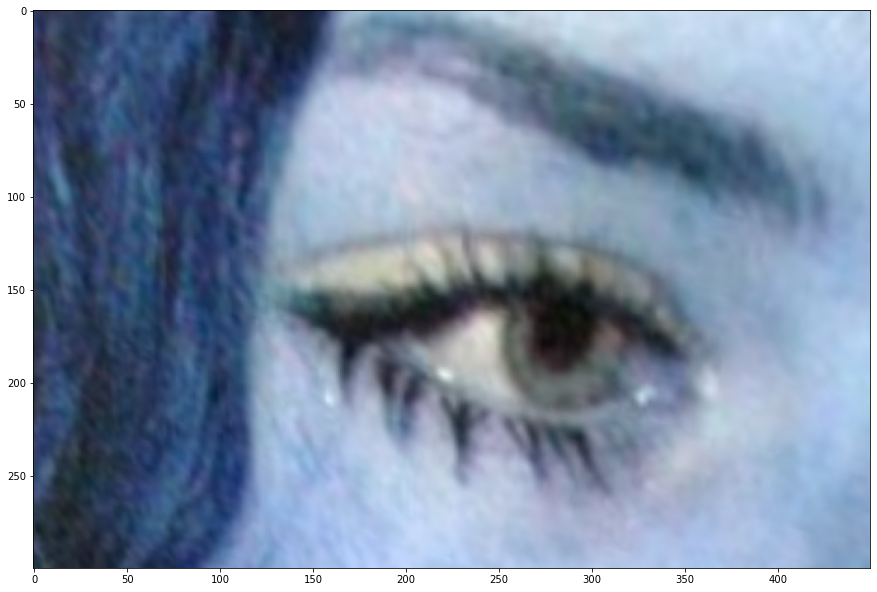

In [141]:
plt.figure(figsize=(15,20))
plt.imshow(imgOutput)